# Eigen face Implementation


In [76]:
import numpy as np
import cv2
import os
from PIL import Image
import matplotlib.cm as cm
import matplotlib.pyplot as plt

In [79]:
def detect_face(image_array):
    # Load the pre-trained face detector from OpenCV
    face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

    # Convert the image to grayscale for face detection
    gray_image = cv2.cvtColor(image_array, cv2.COLOR_BGR2GRAY)

    # Detect faces in the image
    faces = face_cascade.detectMultiScale(gray_image, scaleFactor=1.05,
  minNeighbors=10, minSize=(30, 30),
  flags=cv2.CASCADE_SCALE_IMAGE)

    if len(faces) > 0:
        # Get the coordinates of the first detected face
        x, y, w, h = faces[0]
        
        face = image_array[y:y+h, x:x+w]

        return face
    else:
        return None

In [82]:
BASE_DIRECTORY = "AI Students Picture"


def process_data():
    image_data = []
    targets = []
    names = {}

    for i, folder in enumerate(os.listdir(BASE_DIRECTORY)):
        folder_path = os.path.join(BASE_DIRECTORY, folder)
        names[i] = folder
        for image_file in os.listdir(folder_path):
            image_path = os.path.join(folder_path, image_file)
            try:
                with Image.open(image_path) as img:
                    img_array = np.array(img)
                    face = detect_face(img_array)
                    output_face = Image.fromarray(face)

                    output_image = output_face.resize((150, 150))
                    output_image = output_image.convert("L")
                    # output_array = np.array(output_image)

                    image_data.append(output_image)
                    targets.append(i)
            except Exception as e:
                pass
    # print(image_data)
    image_data = np.array(image_data)
    print(image_data.shape)
    targets = np.array(targets)
    print(names)
    train_data, test_data, train_label, test_label = [], [], [], []

    for person in range(51):
        person_indices = np.where(targets == person)[0]
        train_indices = person_indices[3:11]
        test_indices = person_indices[:3]
        train_data.extend(image_data[train_indices])
        train_label.extend(targets[train_indices])
        test_data.extend(image_data[test_indices])
        test_label.extend(targets[test_indices])

    train_data = np.array(train_data)
    train_label = np.array(train_label)
    test_data = np.array(test_data)
    test_label = np.array(test_label)

    return train_data, train_label, test_data, test_label, names


train_data, train_label, test_data, test_label, names = (
    process_data()
)
print(names)

print("Training Data set", train_data, "\n, Training Labels", train_label)

print("Testing Data set", test_data, "\n, Testing Labels", test_label)

(489, 150, 150)
{0: 'Abdissa Degefu', 1: 'Abdurahman Muhammed', 2: 'Abraham Wendmeneh', 3: 'Amanuel Beyene', 4: 'Amir Ahmedin', 5: 'Ananiya_Tesfahun', 6: 'Betelhem Yimam', 7: 'Bethelhem Yemane', 8: 'Biniyam Haile', 9: 'Dagmawi_Tensay', 10: 'Dawit Getahun', 11: 'Dawit_Abebe', 12: 'Deribew_Shimels', 13: 'Ephrem_Shimels', 14: 'Esayas Nigussie', 15: 'Etsubdink Awoke', 16: 'Fasika_Fikadu', 17: 'Feven Tesfaye', 18: 'Fraol Mulugeta', 19: 'Gedion Ezra', 20: 'Geleta Daba', 21: 'Gelila Moges', 22: 'Gelila Tefera', 23: 'Husen Yusuf', 24: 'Kidus Hunegnaw', 25: 'Leul Degarege', 26: 'Leul Wujira', 27: 'Mariam Yohannes', 28: 'Melkishi Tesfaye', 29: 'Metsakal Zeleke', 30: 'Milion Tolesa', 31: 'Milka Fasika', 32: 'Naol Taye', 33: 'Nathnael Dereje', 34: 'Olyad Temesgen', 35: 'Sahib Semahegn', 36: 'Semir Hamid', 37: 'Shemsu Nurye', 38: 'Sosina Esayas', 39: 'Tewodros Berhanu', 40: 'Tinsae Shemalise', 41: 'Tiruzer Tsedeke', 42: 'Yanet Mekuria', 43: 'Yohannes Ahunm', 44: 'Yohannes Dessie', 45: 'Yohannes Des

In [83]:
def asRowMatrix (X) :
    if len (X) == 0:
        return np . array ([])
    mat = np . empty ((0 , X [0]. size ) , dtype = X [0]. dtype )
    for row in X:
        mat = np . vstack (( mat , np . asarray ( row ). reshape (1 , -1) ))
    return mat

def asColumnMatrix (X):
    if len (X) == 0:
        return np . array ([])
    mat = np . empty (( X [0]. size , 0) , dtype = X [0]. dtype )
    for col in X:
        mat = np . hstack (( mat , np . asarray ( col ). reshape ( -1 ,1) ))
    return mat

In [85]:
def pca (X , y , num_components =0) :
    print(X.shape, "X shape in pca")
    [n , d] = X.shape
    if ( num_components <= 0) or ( num_components >n) :
        num_components = n
    mu = X. mean ( axis =0)
    X = X - mu
    if n > d:
        C = np . dot (X.T ,X)
        [ eigenvalues , eigenvectors ] = np . linalg . eigh (C)
    else :
        C = np . dot (X ,X .T)
        [ eigenvalues , eigenvectors ] = np . linalg . eigh (C)
        eigenvectors = np . dot (X .T , eigenvectors )
        for i in range (n):
            eigenvectors [: , i ] = eigenvectors [: , i ]/ np . linalg . norm ( eigenvectors [: , i ])

    # sort eigenvectors descending by their eigenvalue
    idx = np . argsort ( - eigenvalues )
    eigenvalues = eigenvalues [ idx ]
    eigenvectors = eigenvectors [: , idx ]
    # select only num_components
    eigenvalues = eigenvalues [0: num_components ]. copy ()
    eigenvectors = eigenvectors [: ,0: num_components ]. copy ()
    return [ eigenvalues , eigenvectors , mu ]


In [86]:
def project (W , X , mu = None ):
    if mu is None :
        return np . dot (X ,W)
    return np . dot (X - mu , W)


In [87]:
def reconstruct (W , Y , mu = None ) :
    if mu is None :
        return np . dot (Y ,W.T)
    return np . dot (Y , W .T) + mu

In [89]:
def normalize (X , low , high , dtype = None ):
    X = np . asarray (X)
    minX , maxX = np . min (X ) , np . max (X)
    # normalize to [0...1].
    X = X - float ( minX )
    X = X / float (( maxX - minX ) )
    # scale to [ low ... high ].
    X = X * ( high - low )
    X = X + low
    if dtype is None :
        return np . asarray (X)
    return np . asarray (X , dtype = dtype )


In [90]:
def compute_threshold(train_data, train_label):
    [ eigenvalues , eigenvectors , mu ] = pca(train_data, train_label)
    # U = np.dot((train_data - mu), eigenvectors)

    projection_face_space = project(eigenvectors, train_data)
    diffs = projection_face_space[:, np.newaxis] - projection_face_space
    
        # Calculate norms for all differences
    norms =  np.linalg.norm(diffs, axis=-1)
    
        # Find the maximum norm
    threshold = 0.5 * np.max(norms)

    return threshold

threshold = 25700


In [92]:
from scipy.spatial.distance import pdist, squareform
class EigenfacesModel:
    def __init__(self):
        self . num_components = 0
        self . projections = []
        self .W = []
        self . mu = []
    
    def EuclideanDistance(self, P, q):
        P = np . asarray (P). flatten ()
        q = np . asarray (q). flatten ()
        return np . sqrt ( np . sum ( np . power (( P - q) ,2) ))
    
    def CosineDistance(self, p, q):
        p = np . asarray (p). flatten ()
        q = np . asarray (q). flatten ()
        return -np . dot ( p.T ,q ) / ( np . sqrt ( np . dot (p ,p.T )* np . dot (q ,q.T )))
 
    def ManhattanDistance(self, P, Q):
        P = np.asarray(P).flatten()
        Q = np.asarray(Q).flatten()
        return np.sum(np.abs(P - Q))



    def predict ( self , X):
        minDist = np . finfo ('float') . max
        minClass = -1
        predicted_face = []
        Q = project ( self .W , X. reshape (1 , -1) , self . mu )
        for i in range ( len ( self . projections )):
            dist = self . EuclideanDistance ( self . projections [ i], Q)
            if dist < minDist :
                minDist = dist
                minClass = self . y[i]
                predicted_face = self . projections [ i]
        reconstruction = reconstruct(self.W, Q, self.mu)
        
        e = np.linalg.norm(np.abs(((X.reshape(1, -1)) - self.mu.reshape(1, -1)) - reconstruction))
        if e >= threshold:
            print("Not a face")
        
        elif e < threshold and minDist >= threshold:
            print("New face")
        
        elif e < threshold and minDist < threshold:
            print("Known Face")

        
        
        return minClass, predicted_face
    def compute ( self , X , y):
        [D , self .W , self . mu ] = pca ( asRowMatrix (X) ,y , self . num_components )
        # store labels
        self .y = y
        # store projections
        for xi in X :
            self . projections . append ( project ( self .W , xi . reshape (1 , -1) , self . mu ))

        # Find the maximum distance
        return [D , self .W , self . mu ]

In [93]:
def subplot(title, images, rows, cols, sptitle="subplot", sptitles=[], colormap=cm.gray , ticks_visible=True, filename=None):
	"""
	Plots a list of images in a row.
	Used to plot the results of PCA, ICA and NMF in a row.
	"""
	fig = plt.figure()
	fig.text(.5, .95, title, horizontalalignment='center') 
	for i in range(len(images)):
		ax0 = fig.add_subplot(rows,cols,(i+1))
		plt.setp(ax0.get_xticklabels(), visible=False)
		plt.setp(ax0.get_yticklabels(), visible=False)
		if len(sptitles) == len(images):
			plt.title("%s #%s" % (sptitle, str(sptitles[i])))
		else:
			plt.title("%s #%d" % (sptitle, (i+1)))
		plt.imshow(np.asarray(images[i]).reshape(150, 150), cmap='gray')
	
	plt.show()

(325, 22500) X shape in pca
Known Face


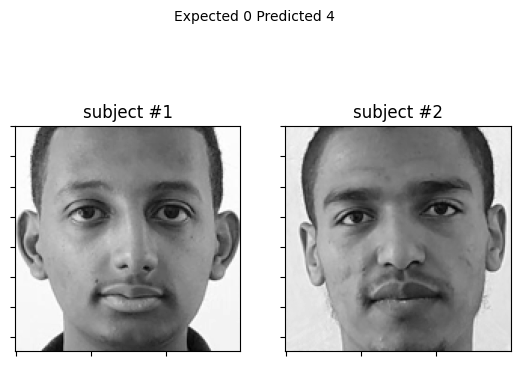

 expected = 0 /  predicted = 4
Known Face


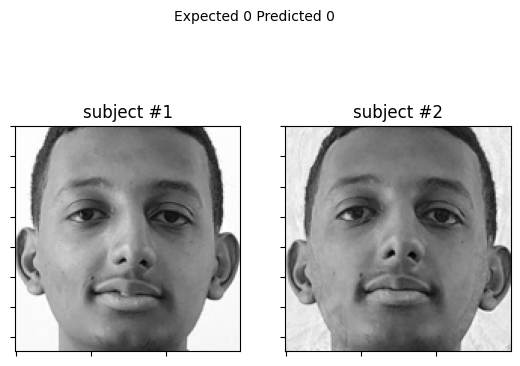

 expected = 0 /  predicted = 0
Known Face


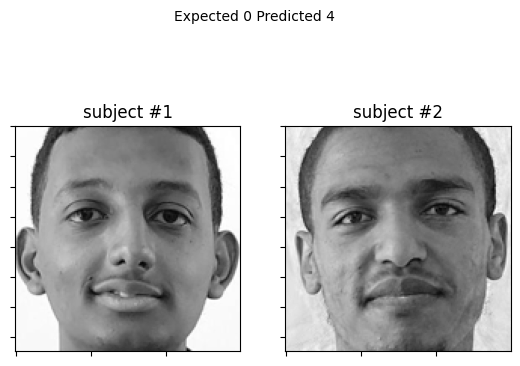

 expected = 0 /  predicted = 4
Known Face


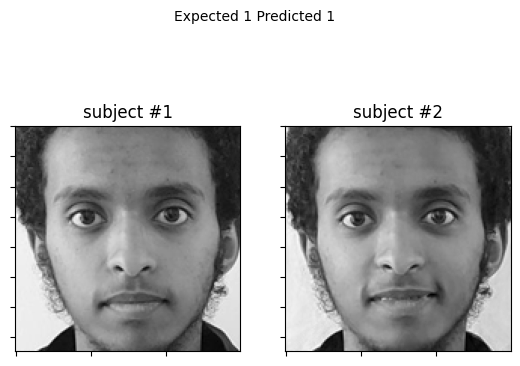

 expected = 1 /  predicted = 1
Known Face


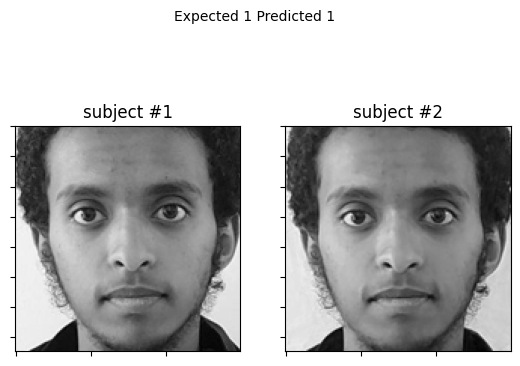

 expected = 1 /  predicted = 1
Known Face


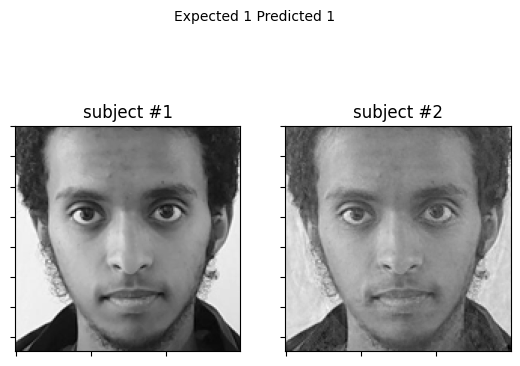

 expected = 1 /  predicted = 1
Known Face


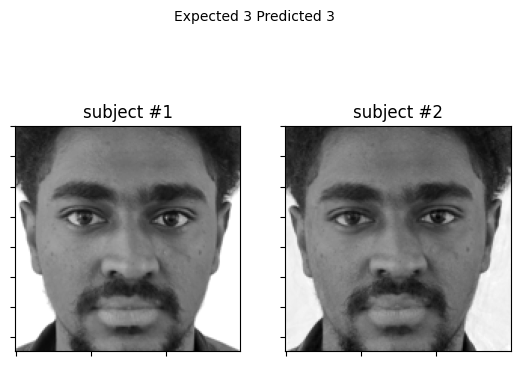

 expected = 3 /  predicted = 3
Known Face


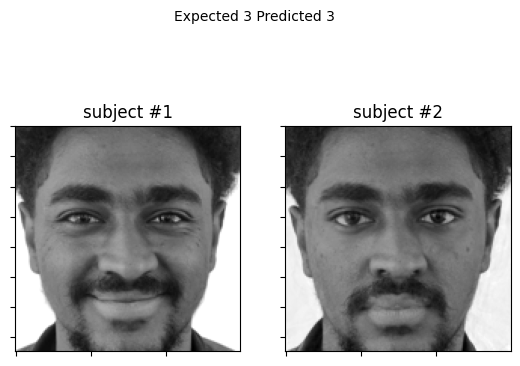

 expected = 3 /  predicted = 3
Known Face


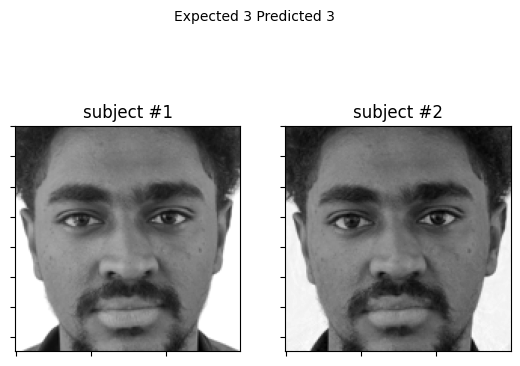

 expected = 3 /  predicted = 3
Known Face


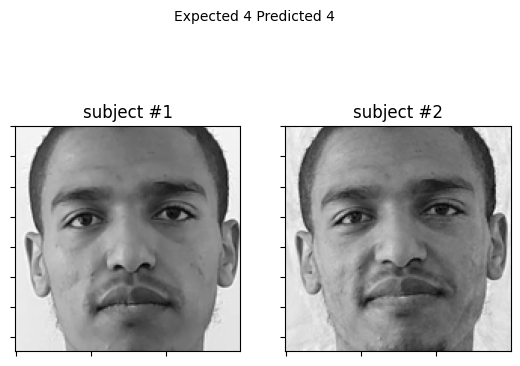

 expected = 4 /  predicted = 4
Known Face


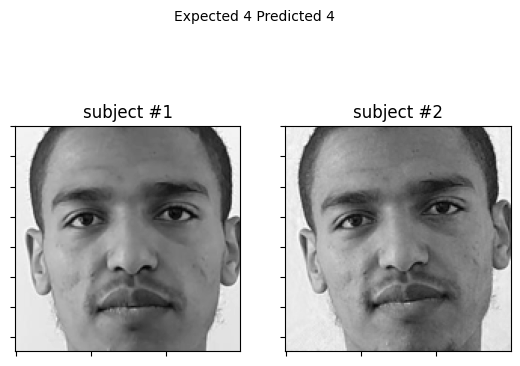

 expected = 4 /  predicted = 4
Known Face


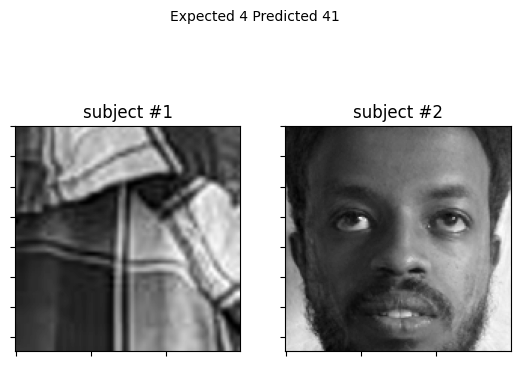

 expected = 4 /  predicted = 41
Known Face


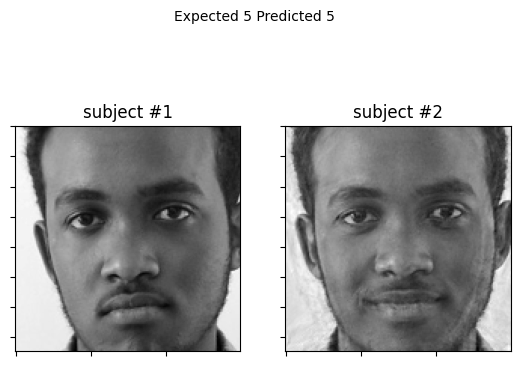

 expected = 5 /  predicted = 5
Known Face


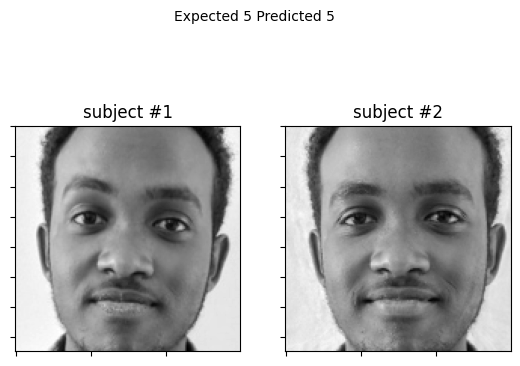

 expected = 5 /  predicted = 5
Known Face


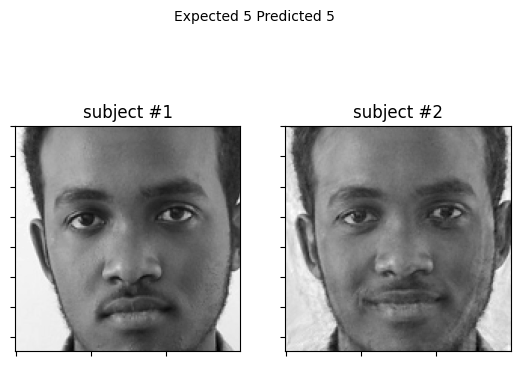

 expected = 5 /  predicted = 5
Known Face


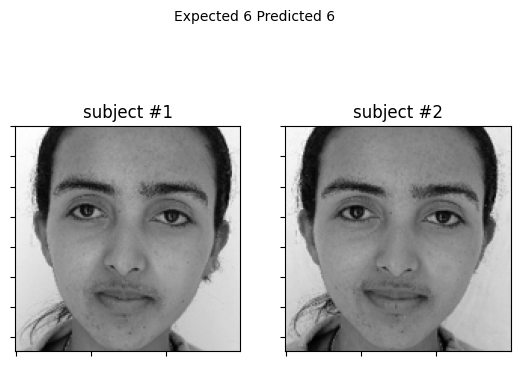

 expected = 6 /  predicted = 6
Known Face


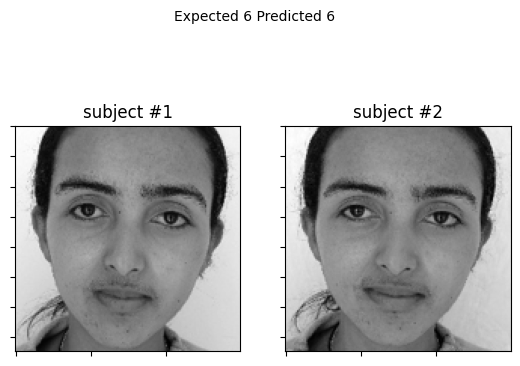

 expected = 6 /  predicted = 6
Known Face


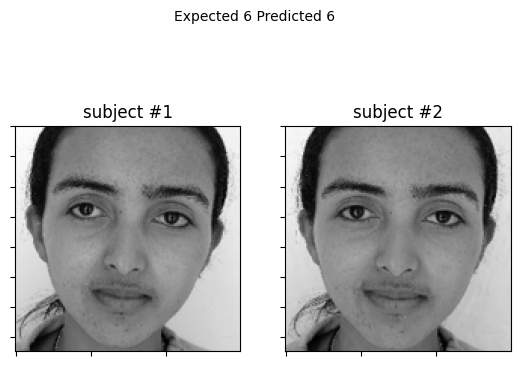

 expected = 6 /  predicted = 6
Known Face


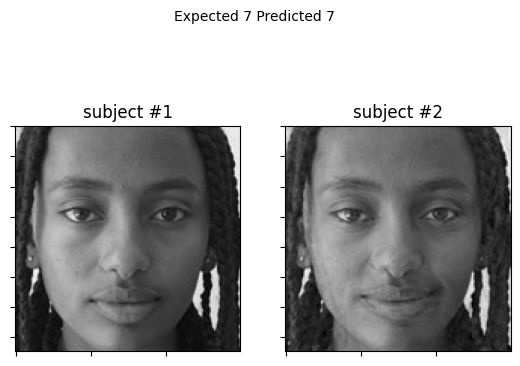

 expected = 7 /  predicted = 7
Known Face


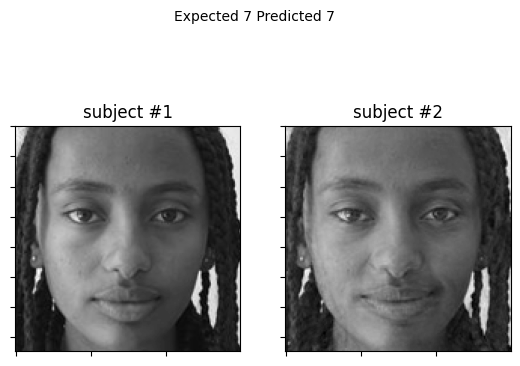

 expected = 7 /  predicted = 7
Known Face


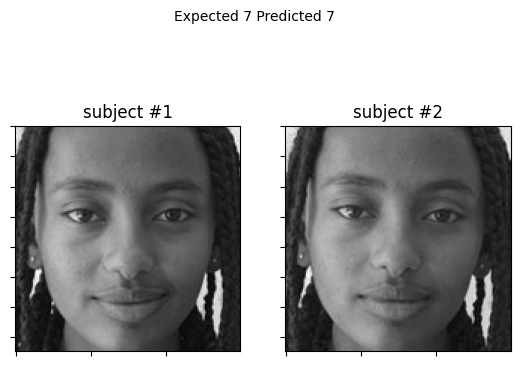

 expected = 7 /  predicted = 7
Known Face


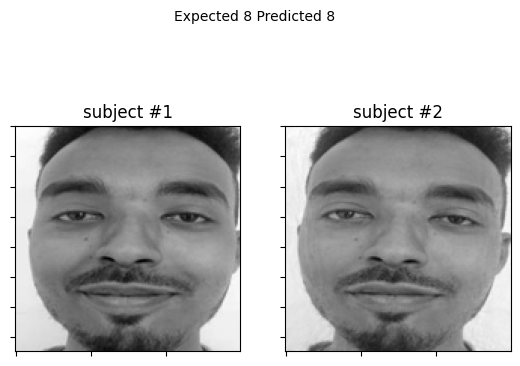

 expected = 8 /  predicted = 8
Known Face


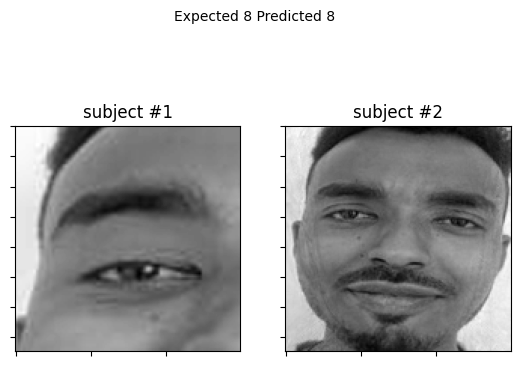

 expected = 8 /  predicted = 8
Known Face


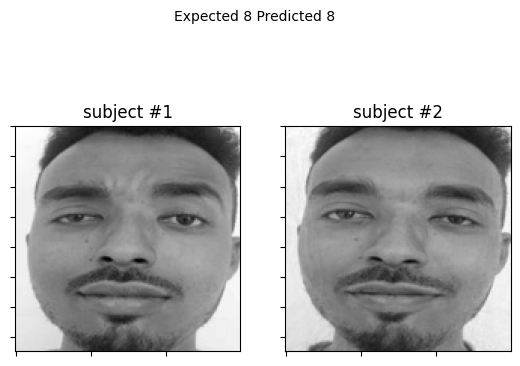

 expected = 8 /  predicted = 8
Known Face


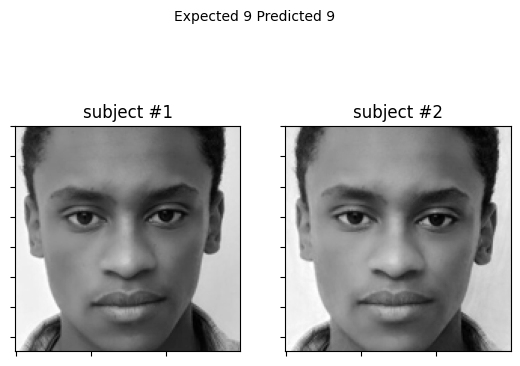

 expected = 9 /  predicted = 9
Known Face


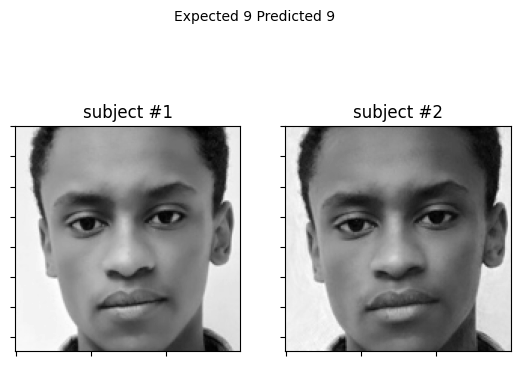

 expected = 9 /  predicted = 9
Known Face


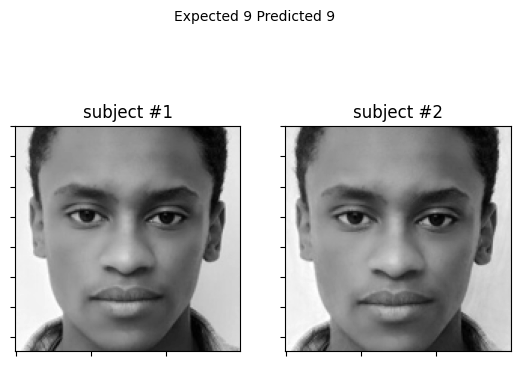

 expected = 9 /  predicted = 9
Known Face


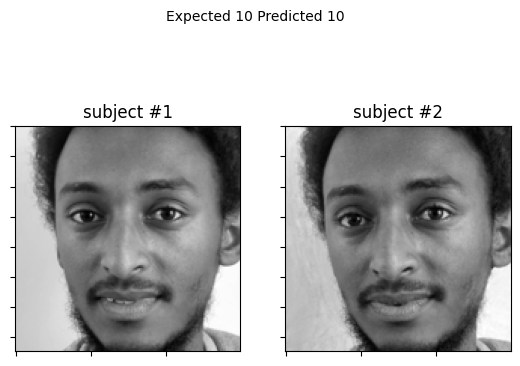

 expected = 10 /  predicted = 10
Known Face


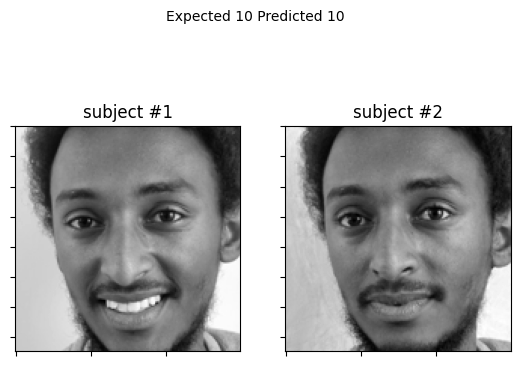

 expected = 10 /  predicted = 10
Known Face


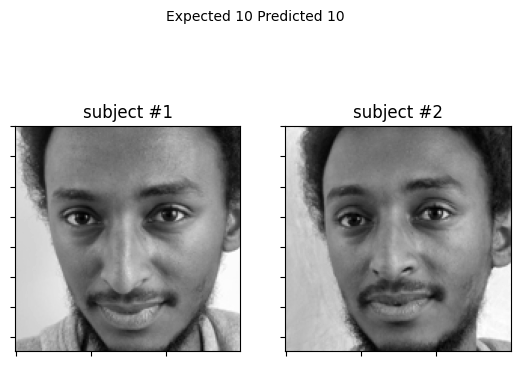

 expected = 10 /  predicted = 10
Known Face


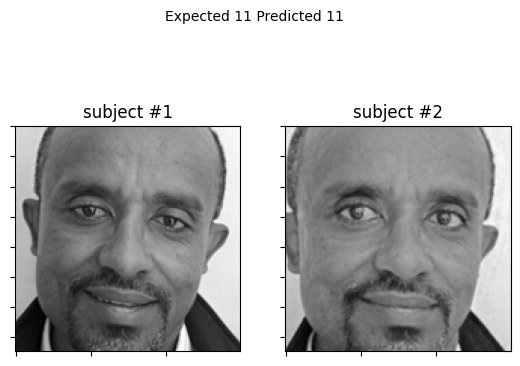

 expected = 11 /  predicted = 11
Known Face


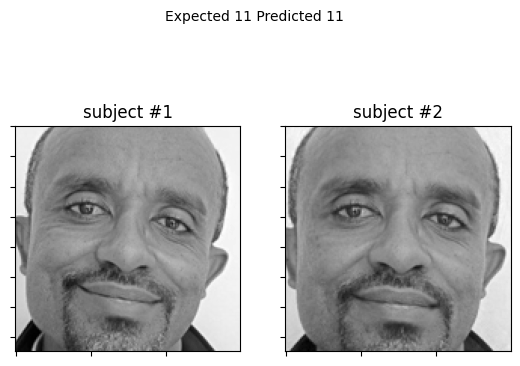

 expected = 11 /  predicted = 11
Known Face


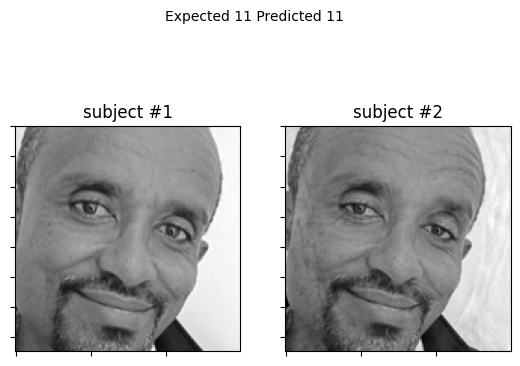

 expected = 11 /  predicted = 11
Known Face


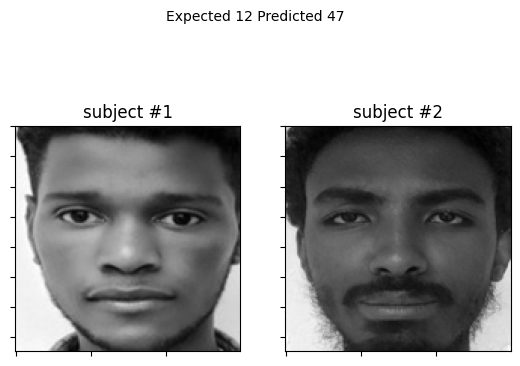

 expected = 12 /  predicted = 47
Known Face


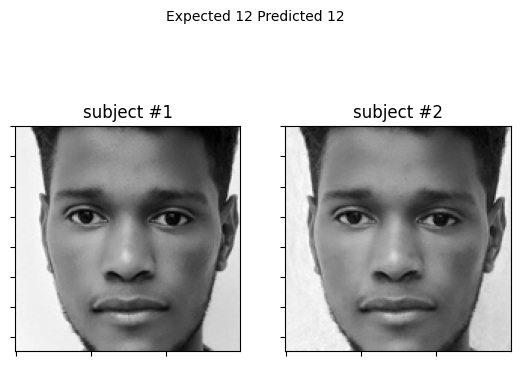

 expected = 12 /  predicted = 12
Known Face


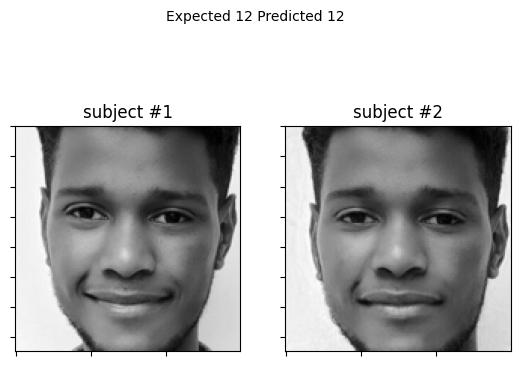

 expected = 12 /  predicted = 12
Known Face


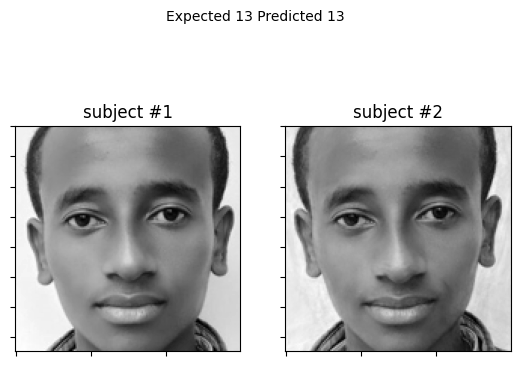

 expected = 13 /  predicted = 13
Known Face


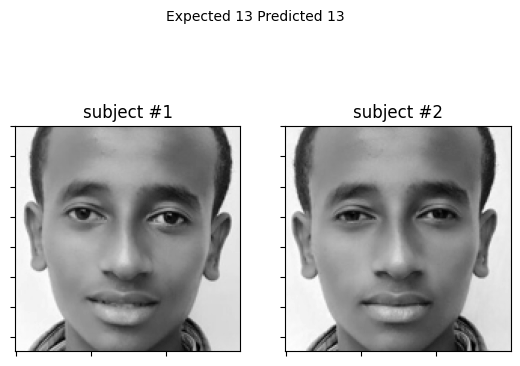

 expected = 13 /  predicted = 13
Known Face


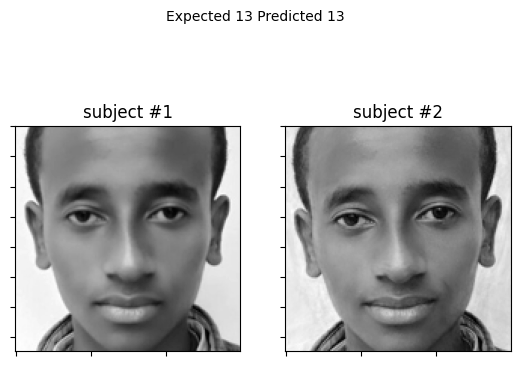

 expected = 13 /  predicted = 13
Known Face


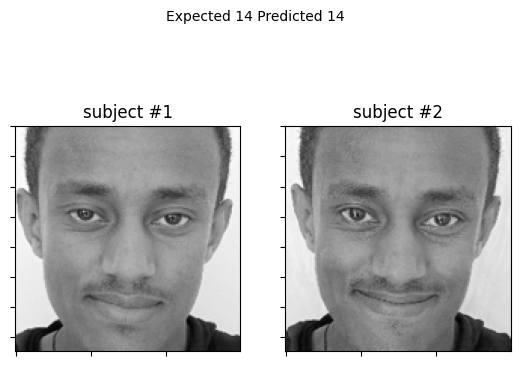

 expected = 14 /  predicted = 14
Known Face


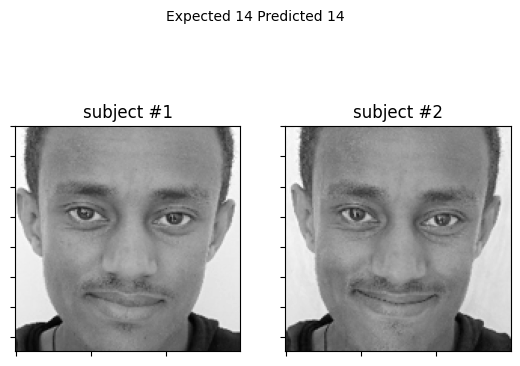

 expected = 14 /  predicted = 14
Known Face


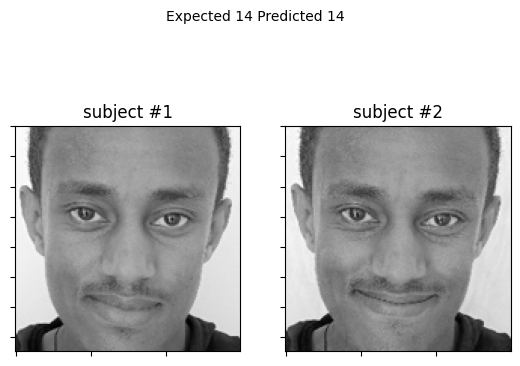

 expected = 14 /  predicted = 14
Known Face


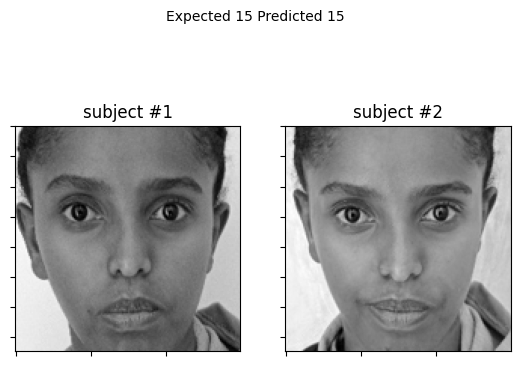

 expected = 15 /  predicted = 15
Known Face


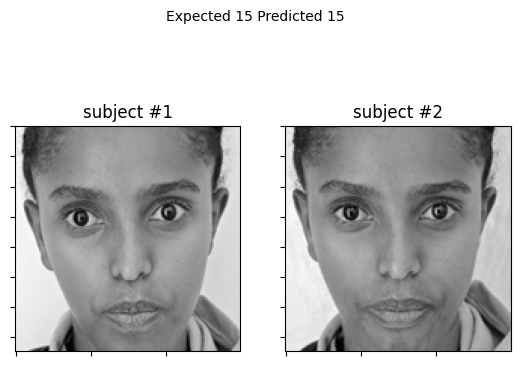

 expected = 15 /  predicted = 15
Known Face


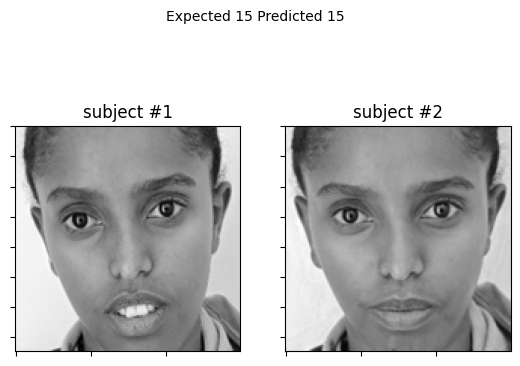

 expected = 15 /  predicted = 15
Known Face


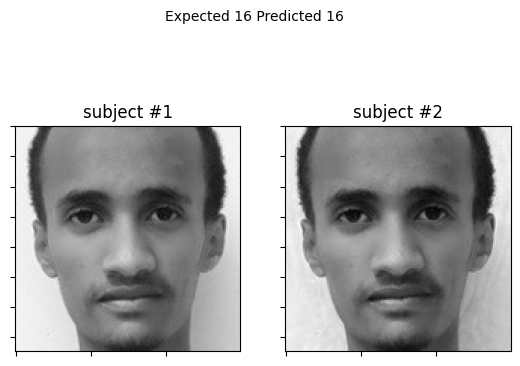

 expected = 16 /  predicted = 16
Known Face


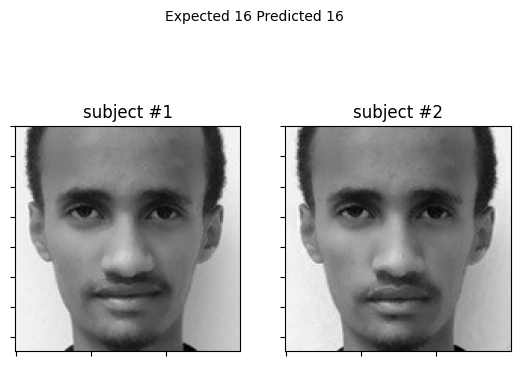

 expected = 16 /  predicted = 16
Known Face


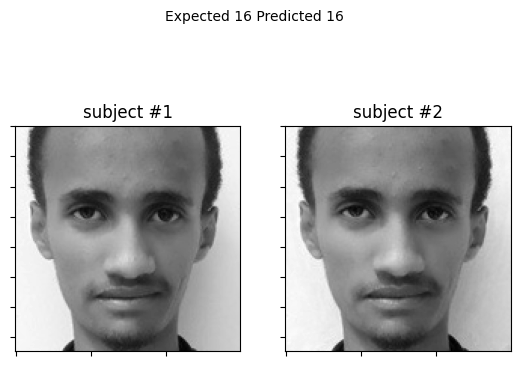

 expected = 16 /  predicted = 16
Known Face


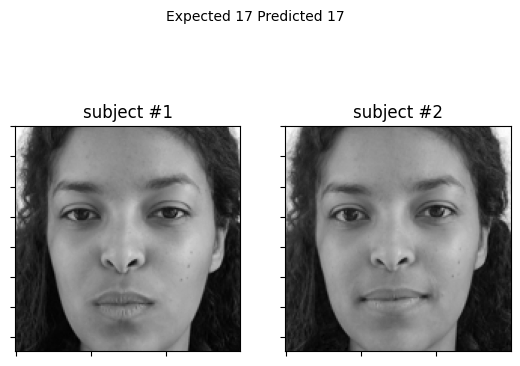

 expected = 17 /  predicted = 17
Known Face


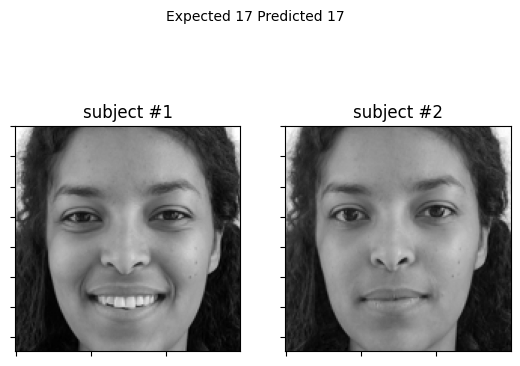

 expected = 17 /  predicted = 17
Known Face


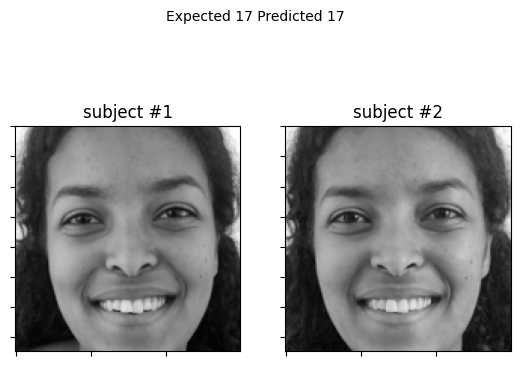

 expected = 17 /  predicted = 17
Known Face


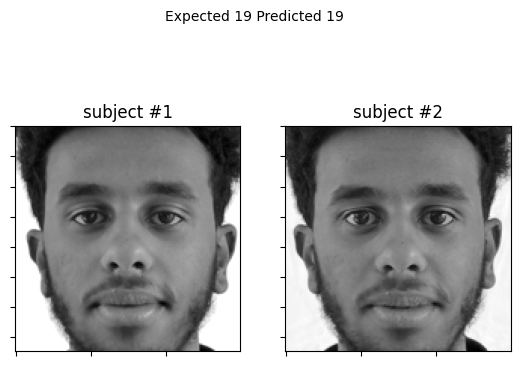

 expected = 19 /  predicted = 19
Known Face


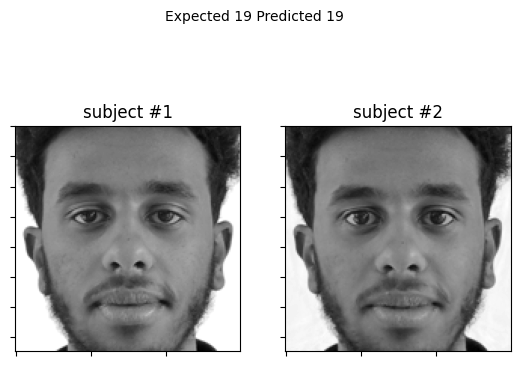

 expected = 19 /  predicted = 19
Known Face


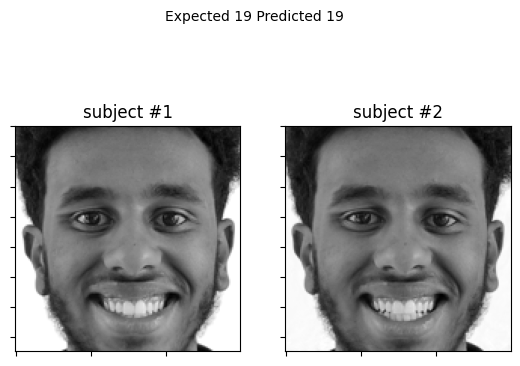

 expected = 19 /  predicted = 19
Known Face


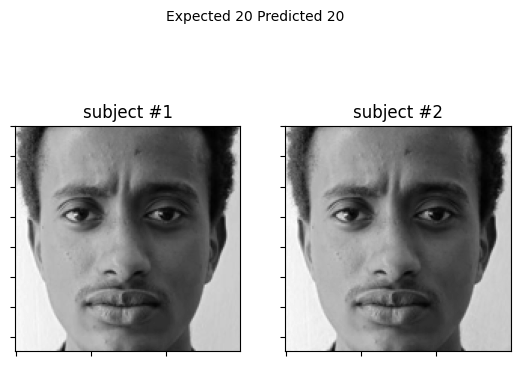

 expected = 20 /  predicted = 20
Known Face


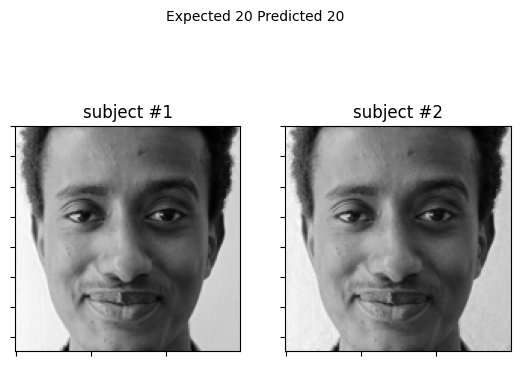

 expected = 20 /  predicted = 20
Known Face


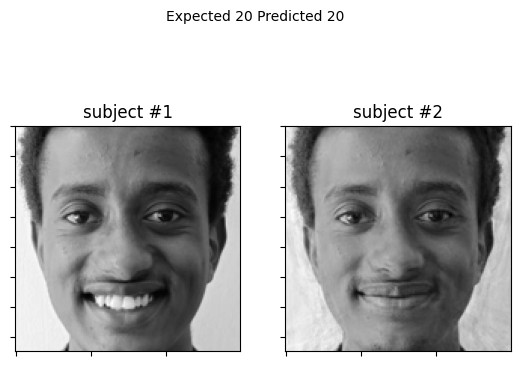

 expected = 20 /  predicted = 20
Known Face


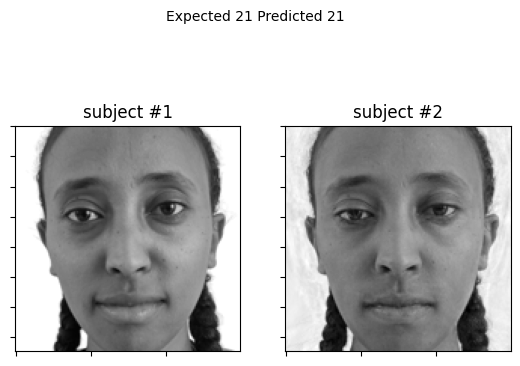

 expected = 21 /  predicted = 21
Known Face


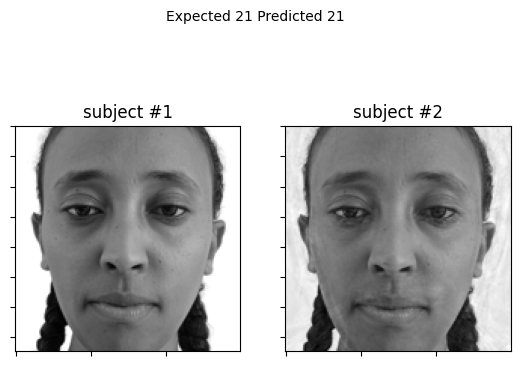

 expected = 21 /  predicted = 21
Known Face


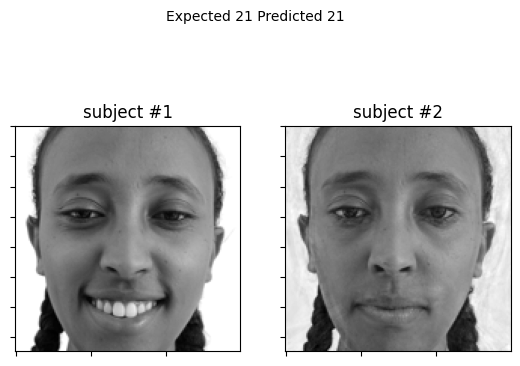

 expected = 21 /  predicted = 21
Known Face


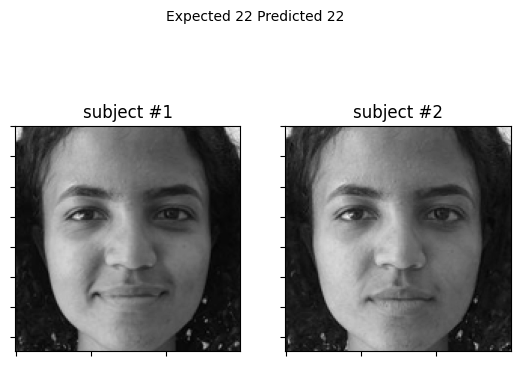

 expected = 22 /  predicted = 22
Known Face


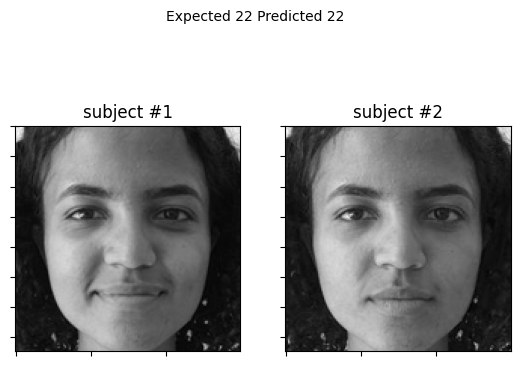

 expected = 22 /  predicted = 22
Known Face


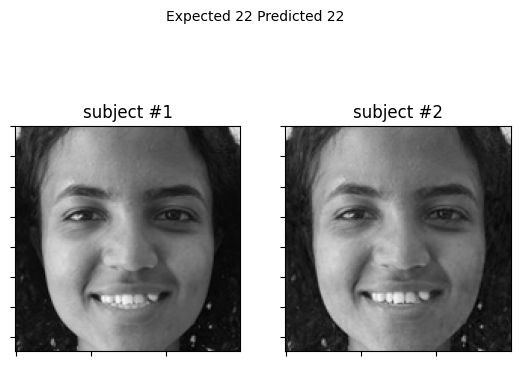

 expected = 22 /  predicted = 22
Known Face


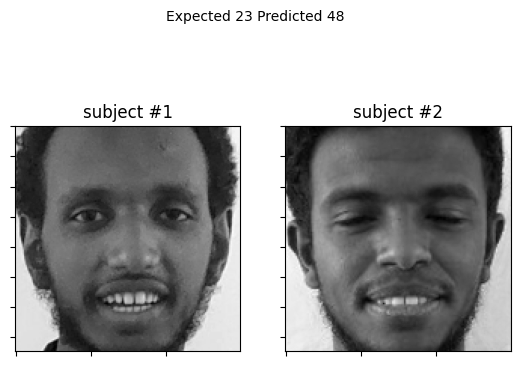

 expected = 23 /  predicted = 48
Known Face


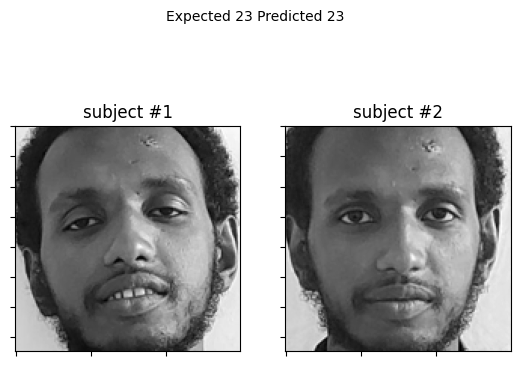

 expected = 23 /  predicted = 23
Known Face


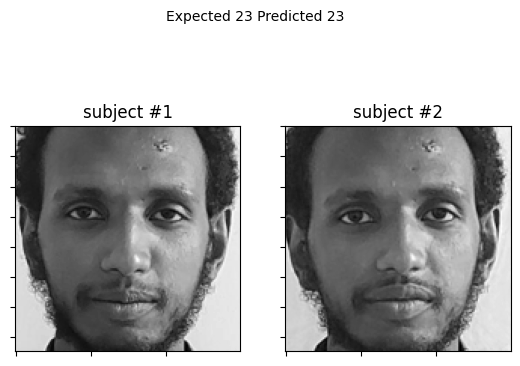

 expected = 23 /  predicted = 23
Known Face


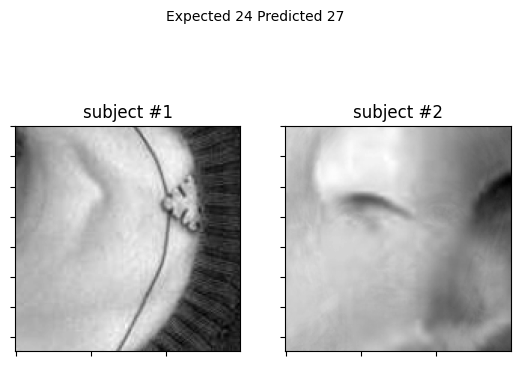

 expected = 24 /  predicted = 27
Known Face


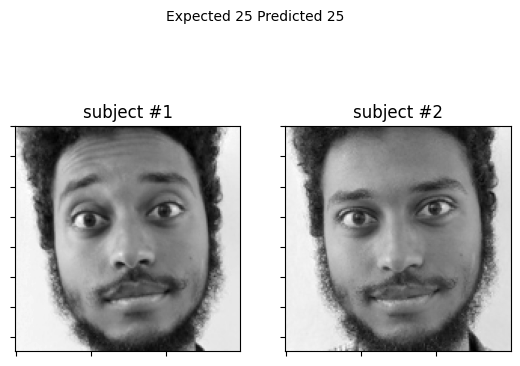

 expected = 25 /  predicted = 25
Known Face


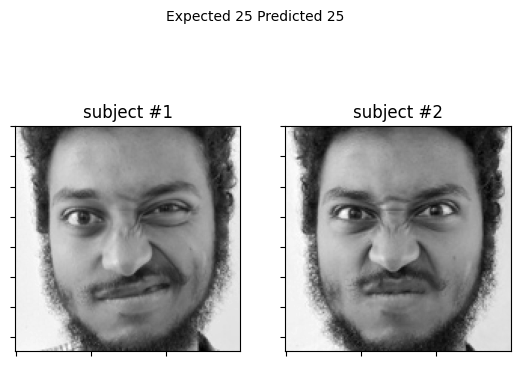

 expected = 25 /  predicted = 25
Known Face


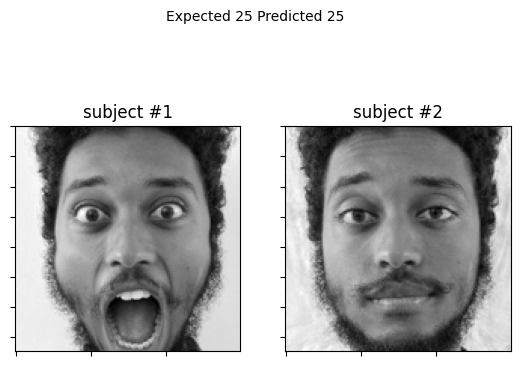

 expected = 25 /  predicted = 25
Known Face


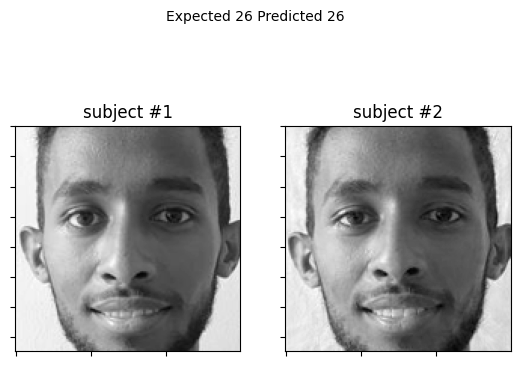

 expected = 26 /  predicted = 26
Known Face


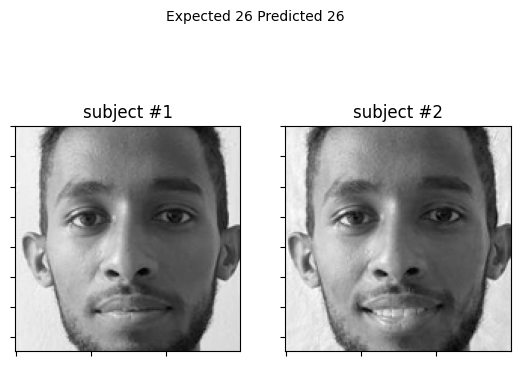

 expected = 26 /  predicted = 26
Known Face


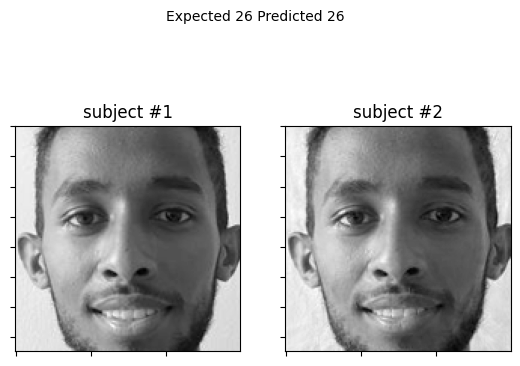

 expected = 26 /  predicted = 26
Known Face


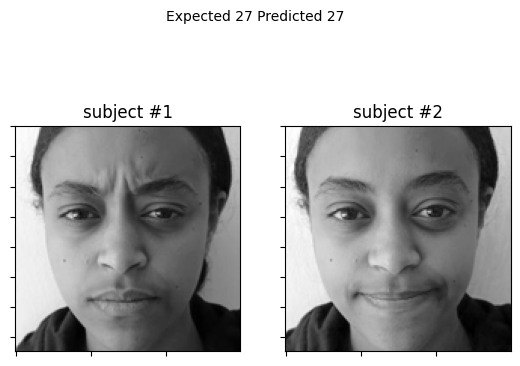

 expected = 27 /  predicted = 27
Known Face


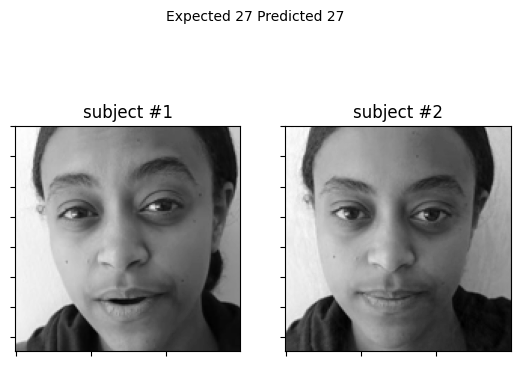

 expected = 27 /  predicted = 27
Known Face


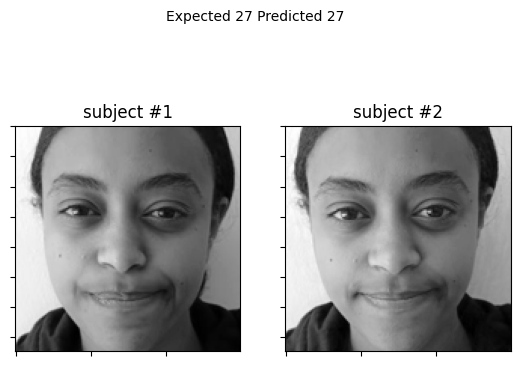

 expected = 27 /  predicted = 27
Known Face


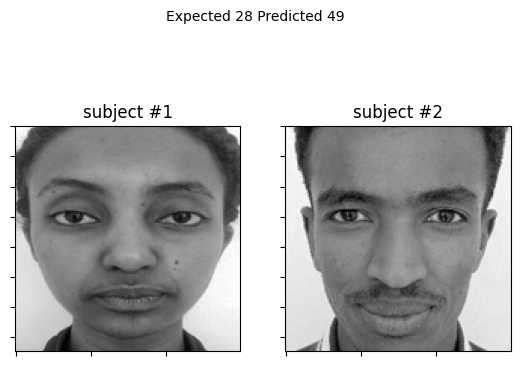

 expected = 28 /  predicted = 49
Known Face


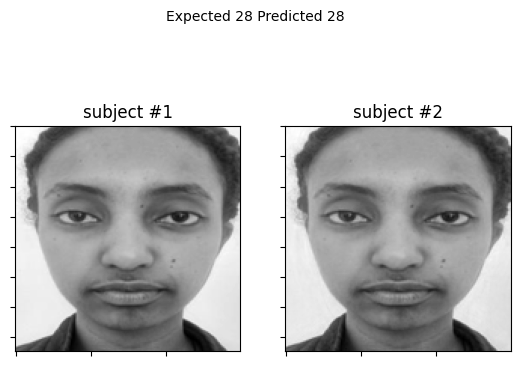

 expected = 28 /  predicted = 28
Known Face


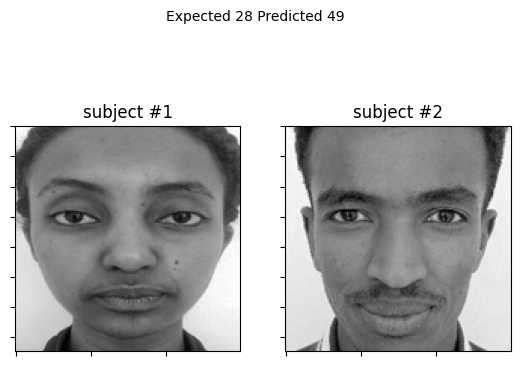

 expected = 28 /  predicted = 49
Known Face


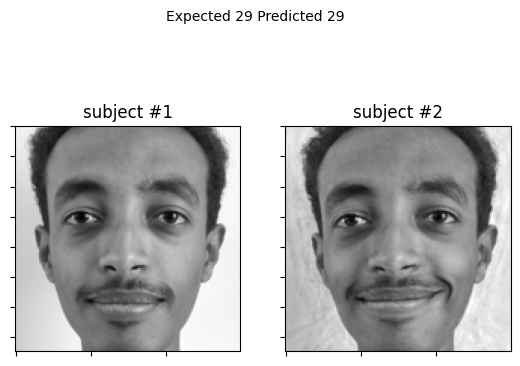

 expected = 29 /  predicted = 29
Known Face


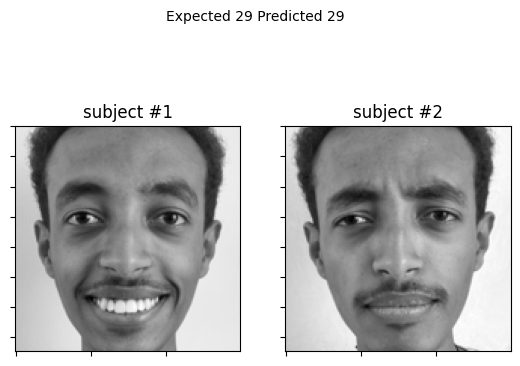

 expected = 29 /  predicted = 29
Known Face


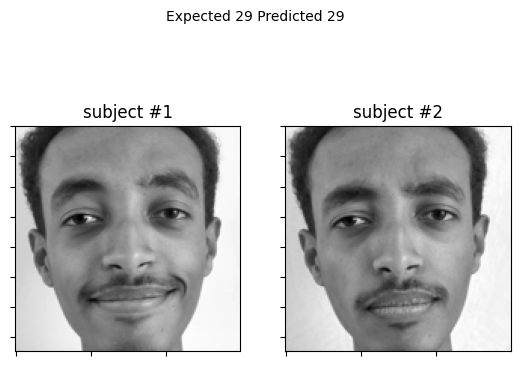

 expected = 29 /  predicted = 29
Known Face


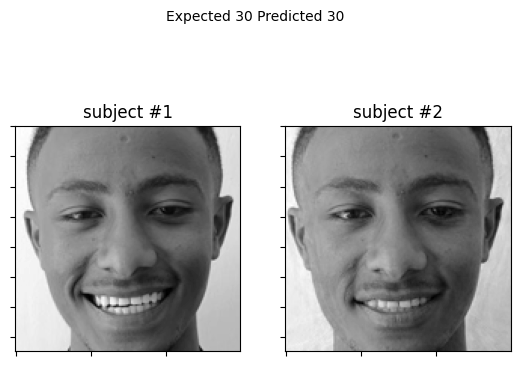

 expected = 30 /  predicted = 30
Known Face


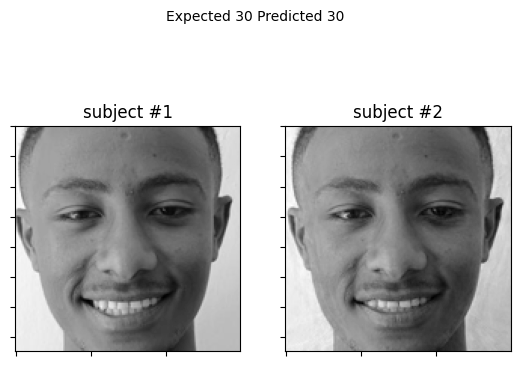

 expected = 30 /  predicted = 30
Known Face


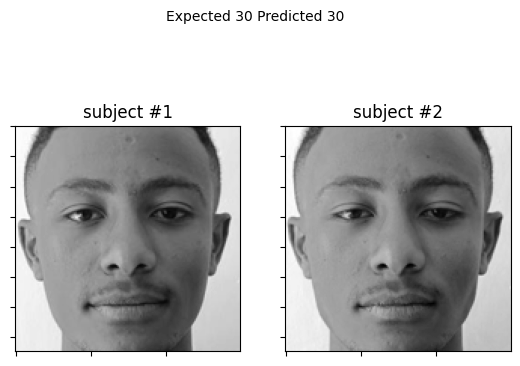

 expected = 30 /  predicted = 30
Known Face


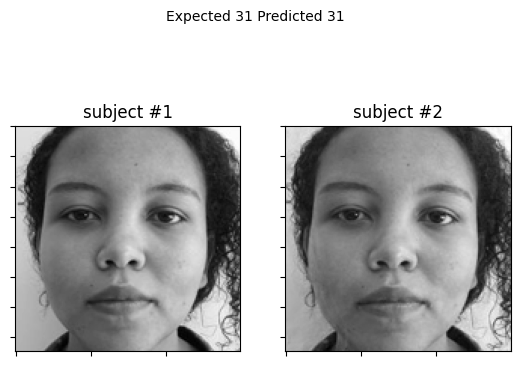

 expected = 31 /  predicted = 31
Known Face


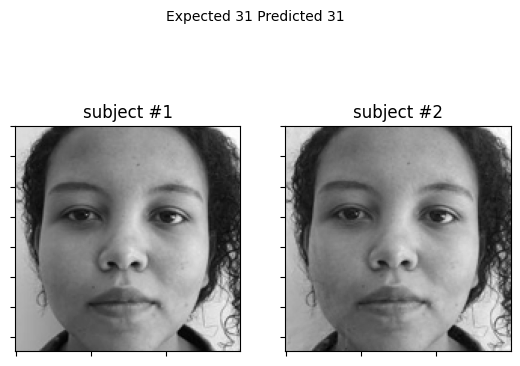

 expected = 31 /  predicted = 31
Known Face


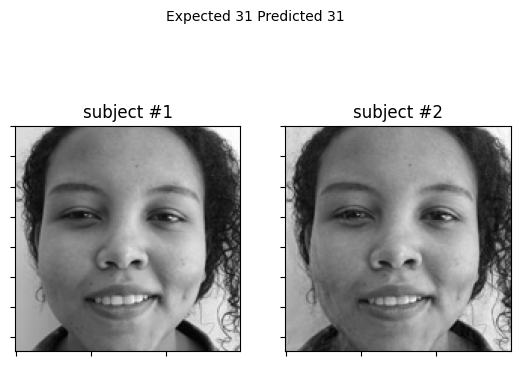

 expected = 31 /  predicted = 31
Known Face


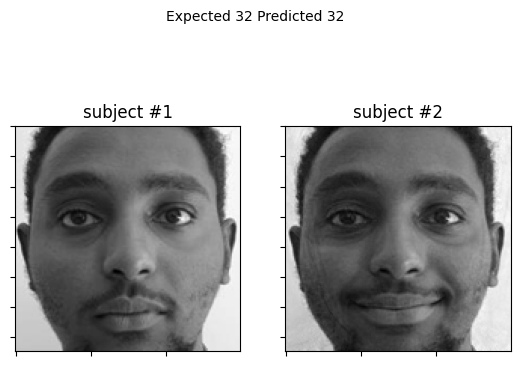

 expected = 32 /  predicted = 32
Known Face


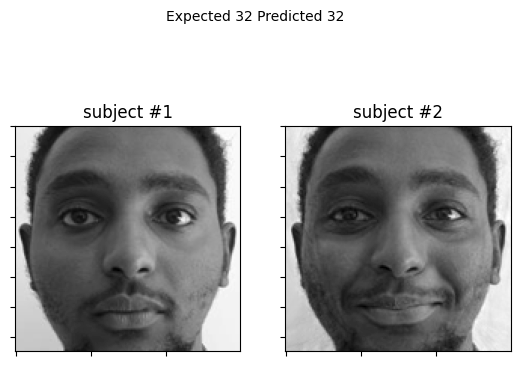

 expected = 32 /  predicted = 32
Known Face


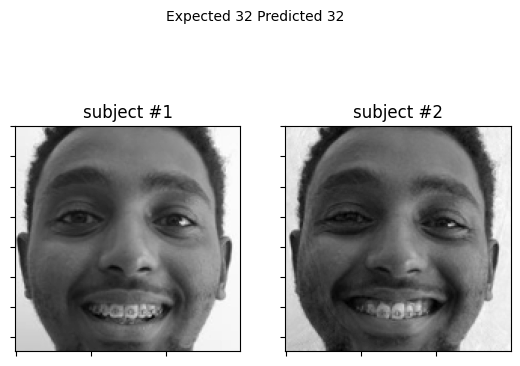

 expected = 32 /  predicted = 32
Known Face


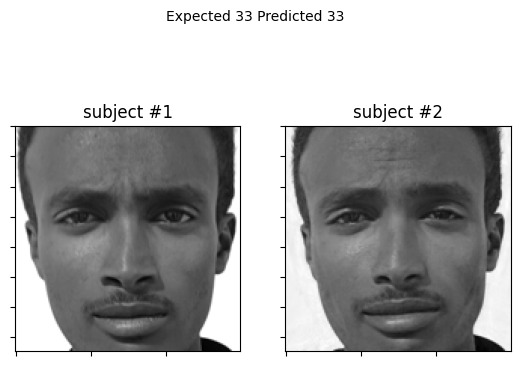

 expected = 33 /  predicted = 33
Known Face


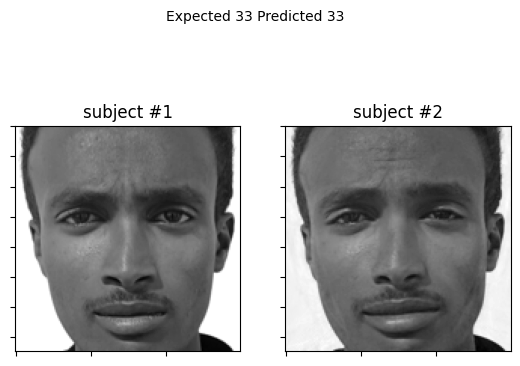

 expected = 33 /  predicted = 33
Known Face


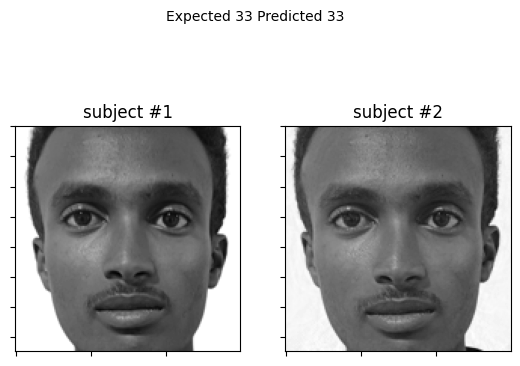

 expected = 33 /  predicted = 33
Known Face


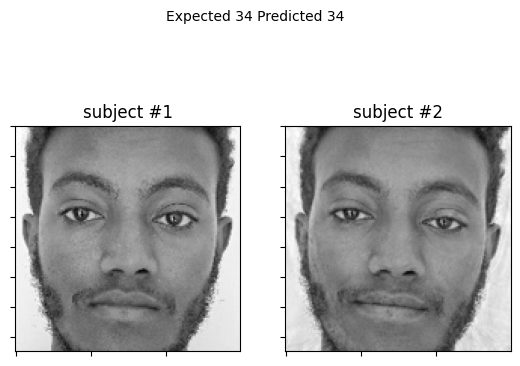

 expected = 34 /  predicted = 34
Known Face


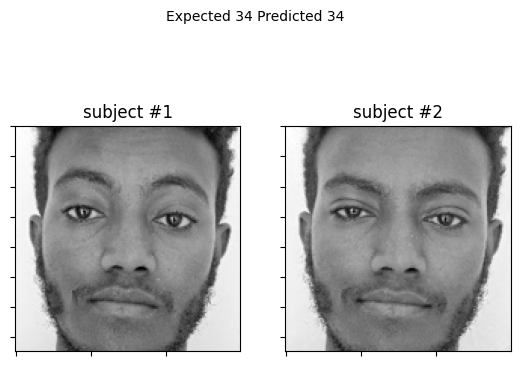

 expected = 34 /  predicted = 34
Known Face


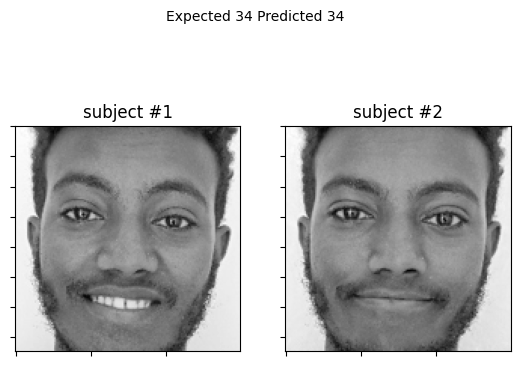

 expected = 34 /  predicted = 34
Known Face


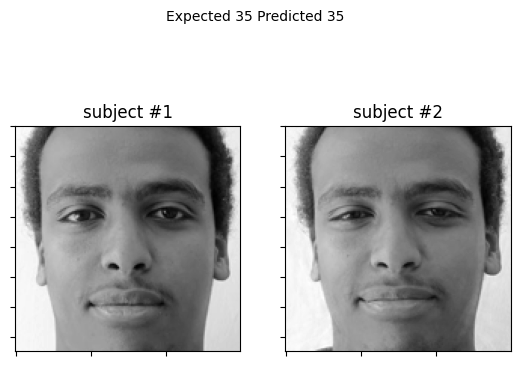

 expected = 35 /  predicted = 35
Known Face


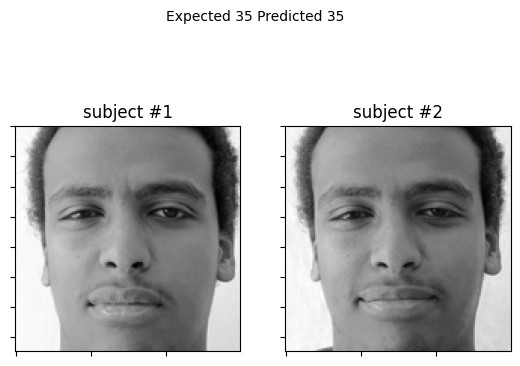

 expected = 35 /  predicted = 35
Known Face


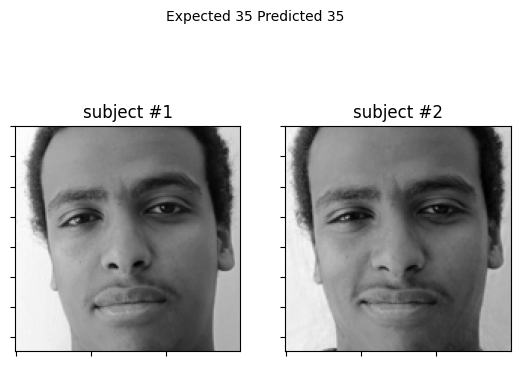

 expected = 35 /  predicted = 35
Known Face


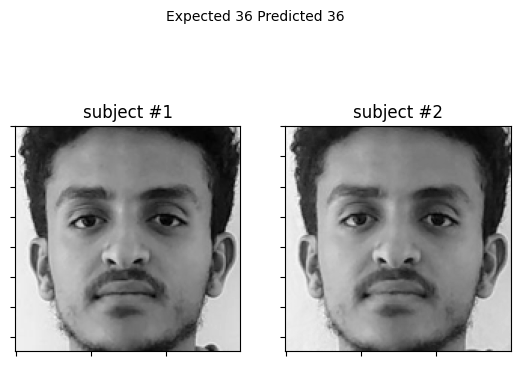

 expected = 36 /  predicted = 36
Known Face


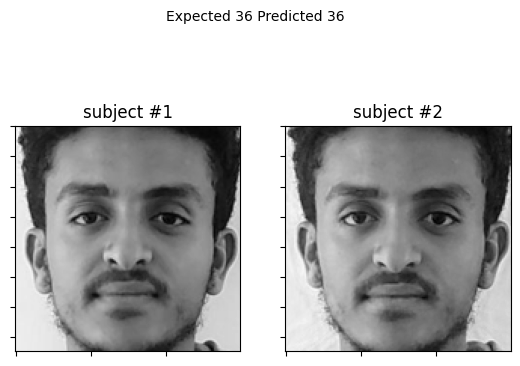

 expected = 36 /  predicted = 36
Known Face


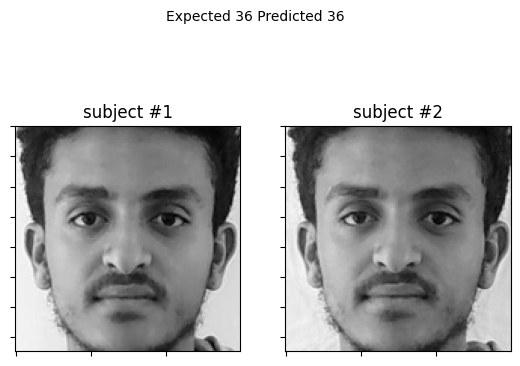

 expected = 36 /  predicted = 36
Known Face


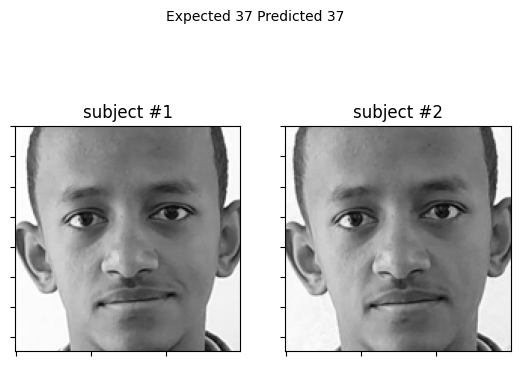

 expected = 37 /  predicted = 37
Known Face


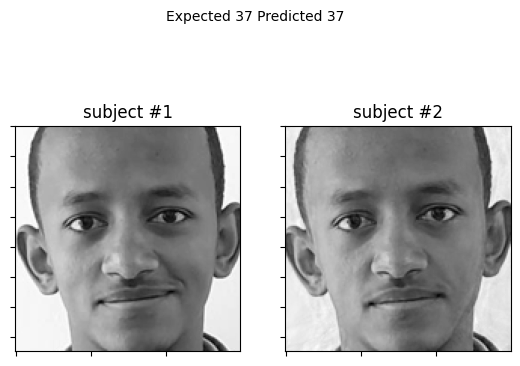

 expected = 37 /  predicted = 37
Known Face


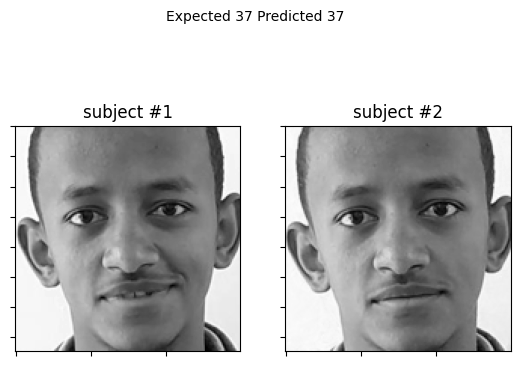

 expected = 37 /  predicted = 37
Known Face


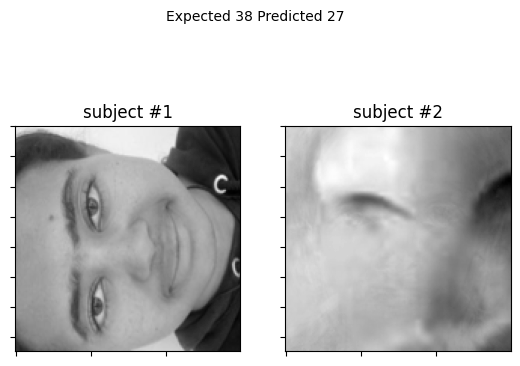

 expected = 38 /  predicted = 27
Known Face


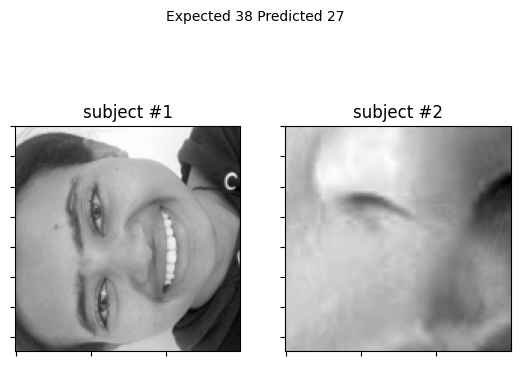

 expected = 38 /  predicted = 27
Known Face


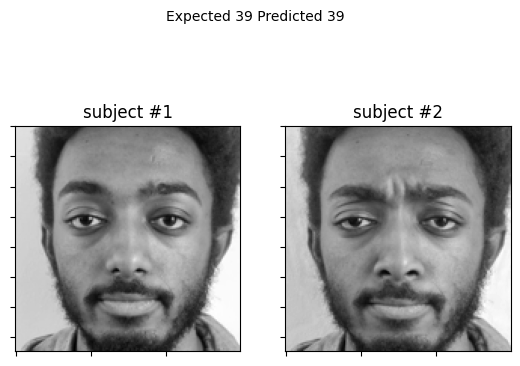

 expected = 39 /  predicted = 39
Known Face


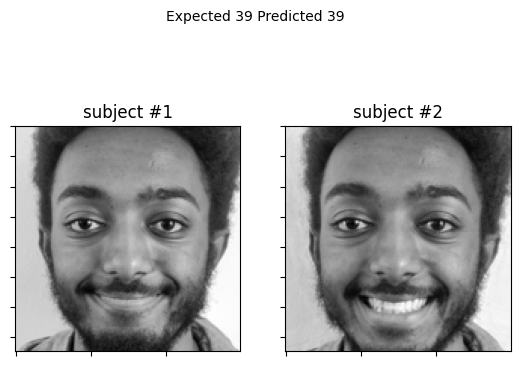

 expected = 39 /  predicted = 39
Known Face


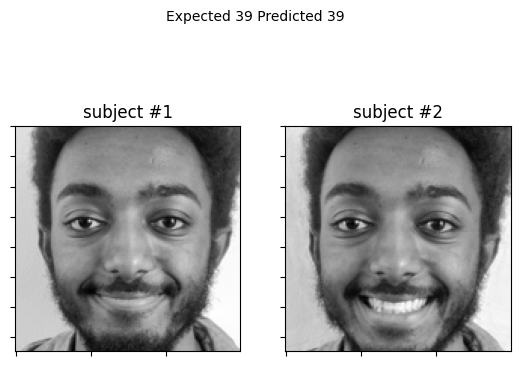

 expected = 39 /  predicted = 39
Known Face


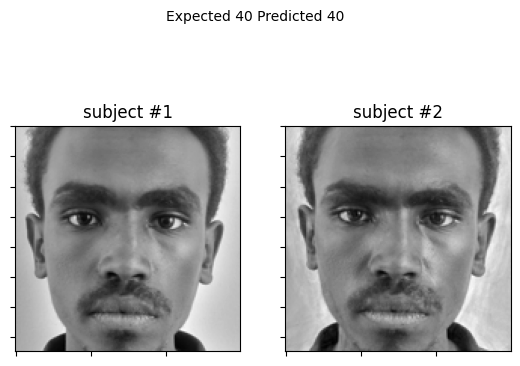

 expected = 40 /  predicted = 40
Known Face


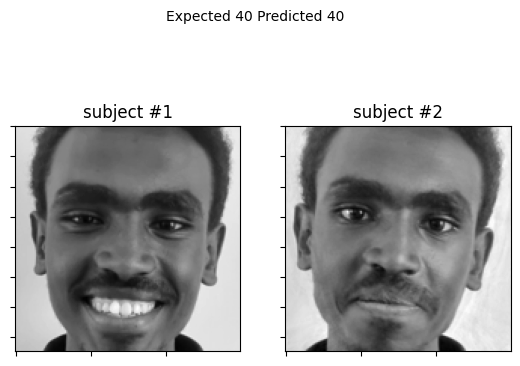

 expected = 40 /  predicted = 40
Known Face


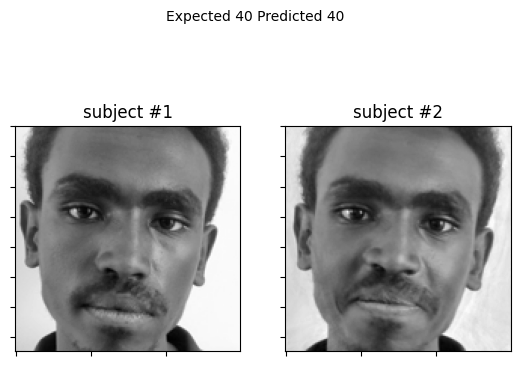

 expected = 40 /  predicted = 40
Known Face


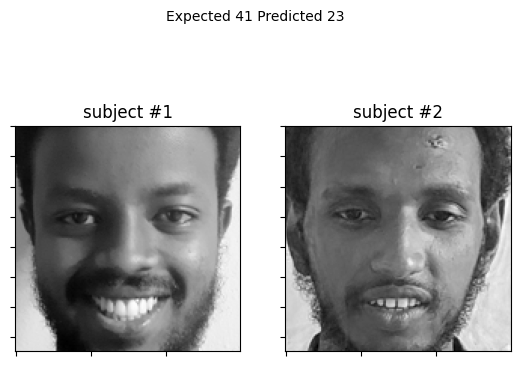

 expected = 41 /  predicted = 23
Known Face


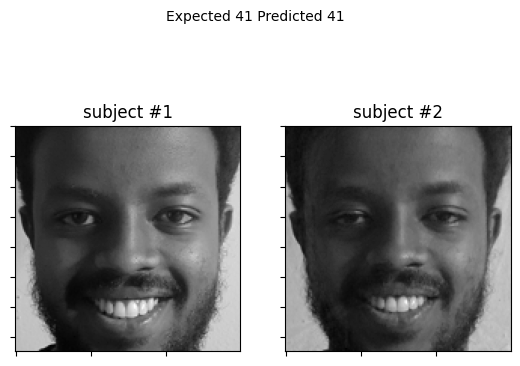

 expected = 41 /  predicted = 41
Known Face


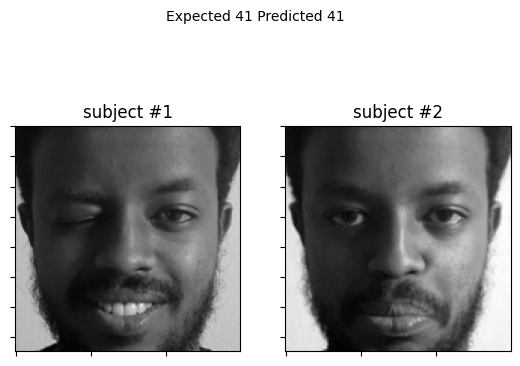

 expected = 41 /  predicted = 41
Known Face


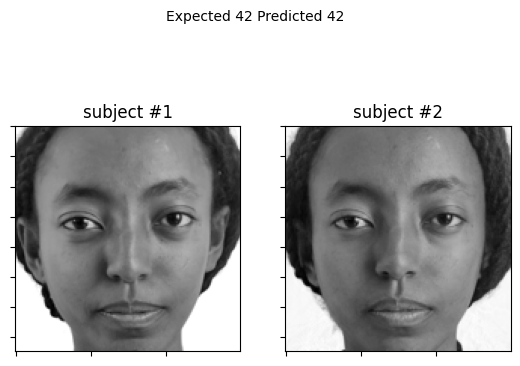

 expected = 42 /  predicted = 42
Known Face


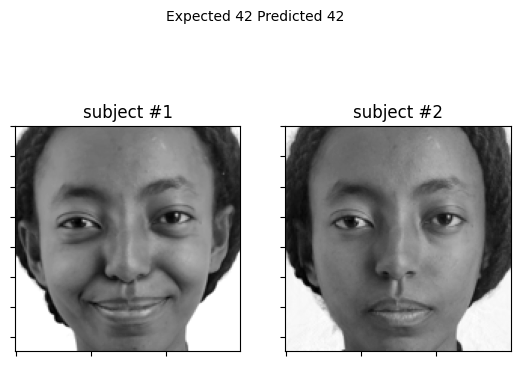

 expected = 42 /  predicted = 42
Known Face


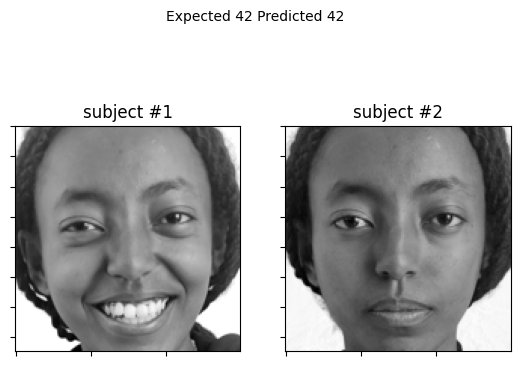

 expected = 42 /  predicted = 42
Known Face


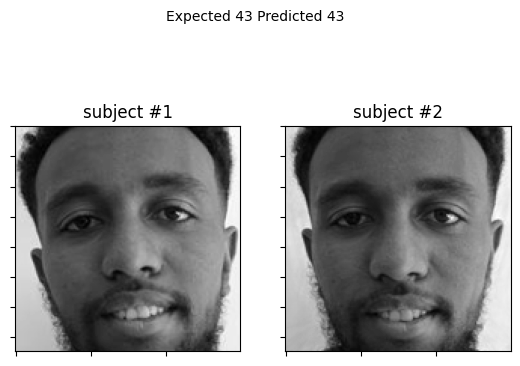

 expected = 43 /  predicted = 43
Known Face


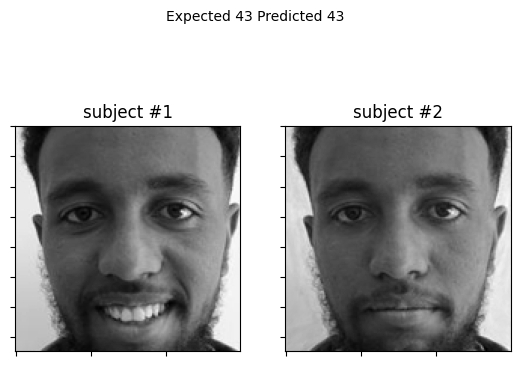

 expected = 43 /  predicted = 43
Known Face


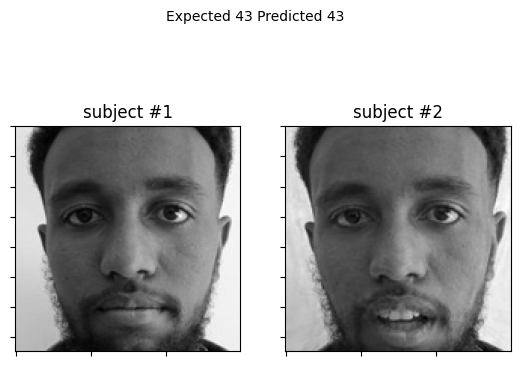

 expected = 43 /  predicted = 43
Known Face


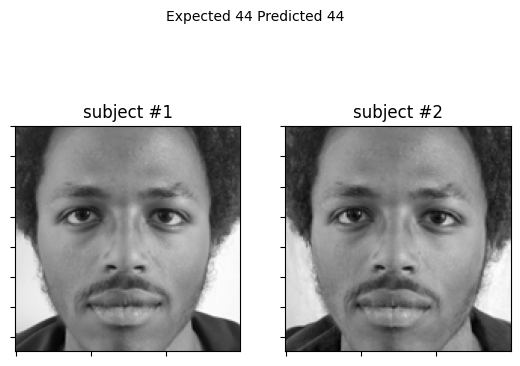

 expected = 44 /  predicted = 44
Known Face


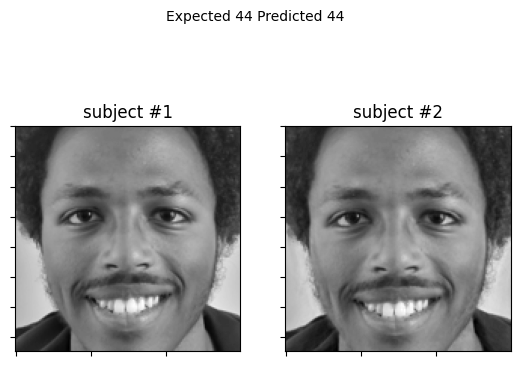

 expected = 44 /  predicted = 44
Known Face


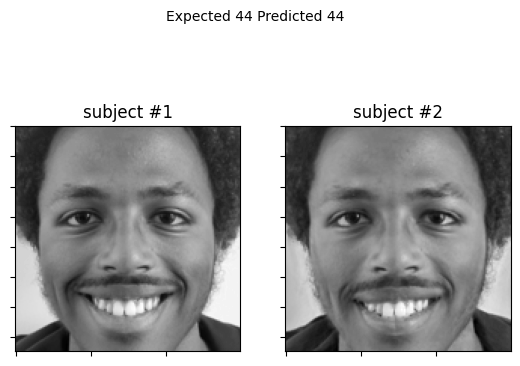

 expected = 44 /  predicted = 44
Known Face


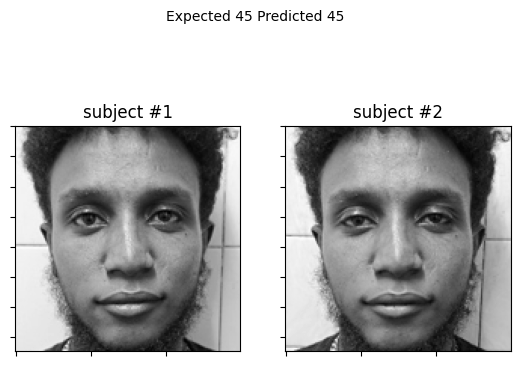

 expected = 45 /  predicted = 45
Known Face


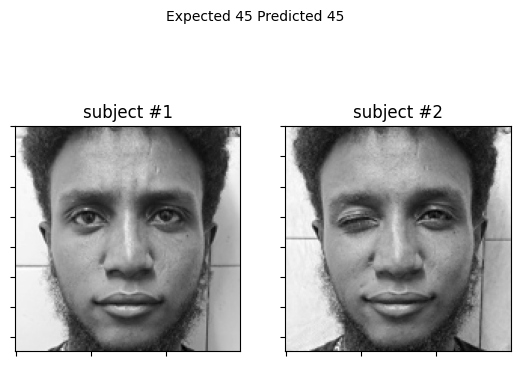

 expected = 45 /  predicted = 45
Known Face


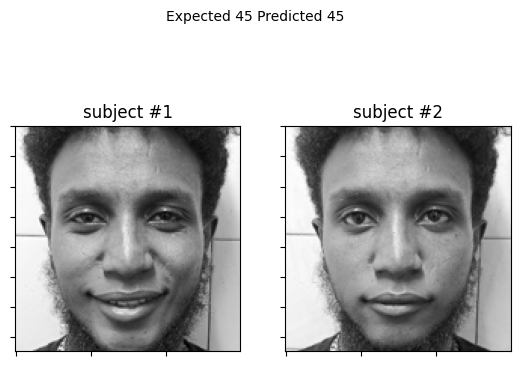

 expected = 45 /  predicted = 45
Known Face


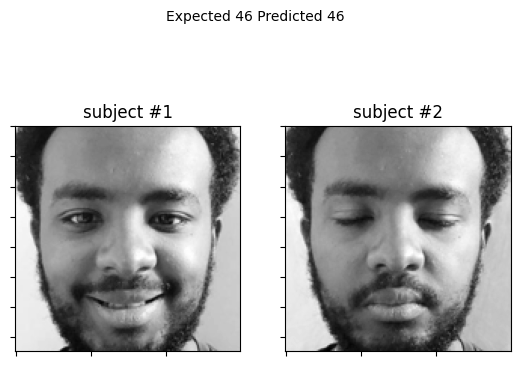

 expected = 46 /  predicted = 46
Known Face


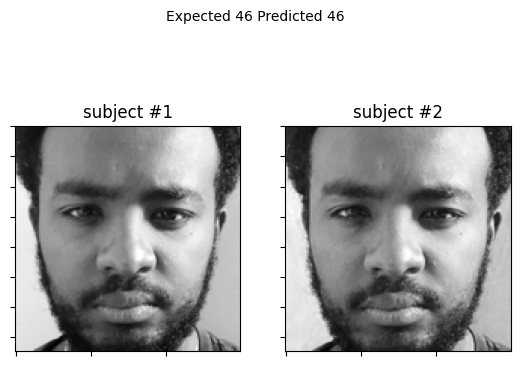

 expected = 46 /  predicted = 46
Known Face


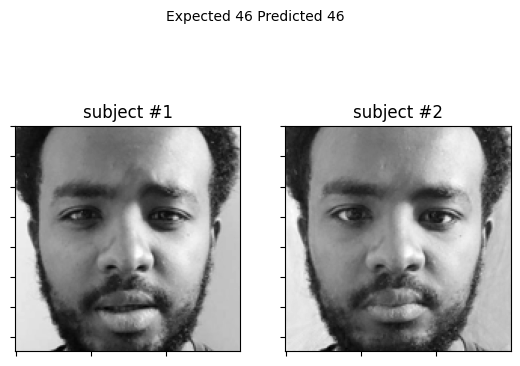

 expected = 46 /  predicted = 46
Known Face


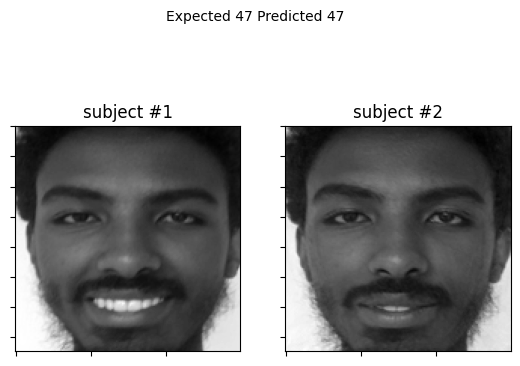

 expected = 47 /  predicted = 47
Known Face


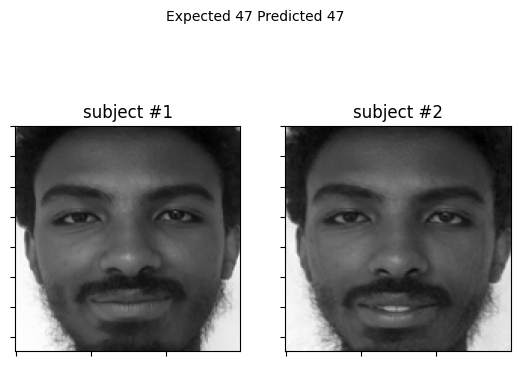

 expected = 47 /  predicted = 47
Known Face


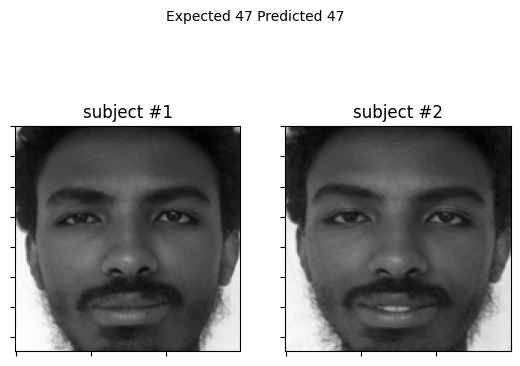

 expected = 47 /  predicted = 47
Known Face


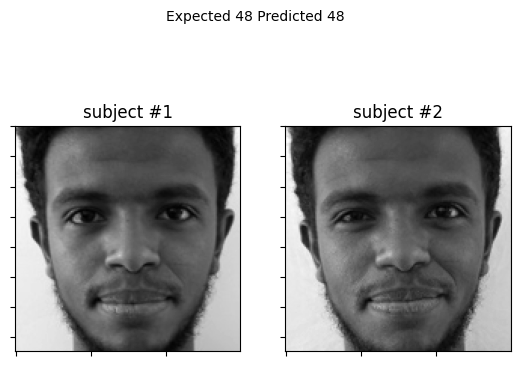

 expected = 48 /  predicted = 48
Known Face


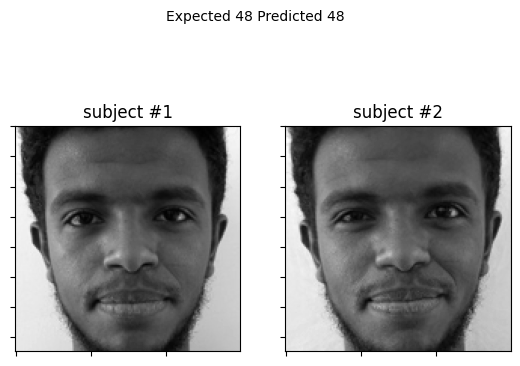

 expected = 48 /  predicted = 48
Known Face


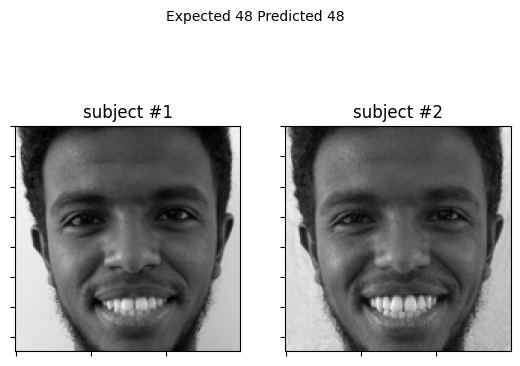

 expected = 48 /  predicted = 48
Known Face


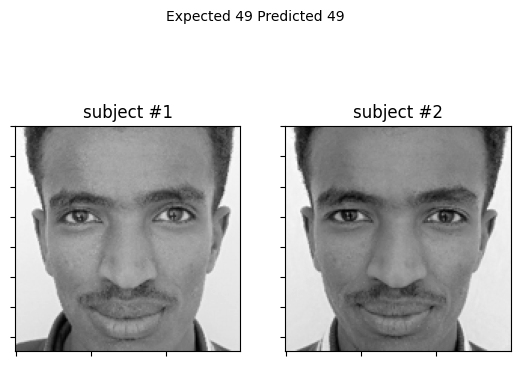

 expected = 49 /  predicted = 49
Known Face


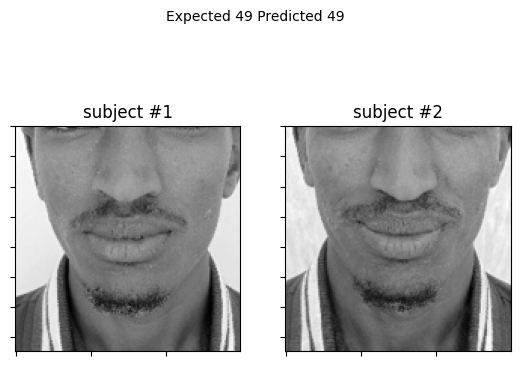

 expected = 49 /  predicted = 49
Known Face


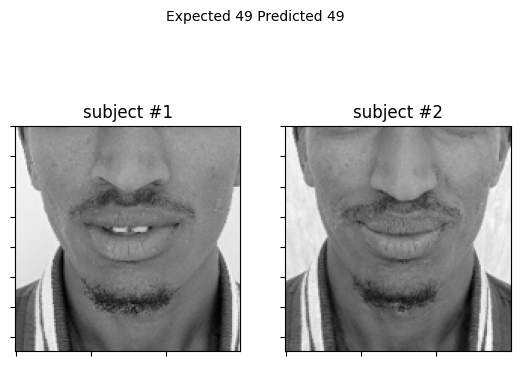

 expected = 49 /  predicted = 49
The accuracy is 92.19858156028369


In [94]:
model = EigenfacesModel()
[D, W, mu] = model.compute(asRowMatrix(train_data), train_label)
correct = 0
total = 0
for i in range(len(test_data)):
    predict, predicted_face = model.predict(test_data[i])
    # get a prediction for the first observation
    if test_label[i] == predict:
        correct += 1
    total += 1

    subplot(
        title="Expected " + str(test_label[i]) + " Predicted " + str(predict),
        images=[test_data[i], reconstruct(W, predicted_face, mu)],
        rows=1,
        cols=2,
        sptitle="subject",
        colormap=cm.gray,
        filename="python_pca_reconstruction_subject_" + str(i) + ".png",
    )
    print(" expected =", test_label[i], "/", " predicted =", predict)
print("The accuracy is", (correct / total) * 100)